In [258]:
# Import packages
%reload_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

In [259]:
import os
import numpy as np
import matplotlib.pyplot as plt
import scarlet

import kuaizi as kz
from kuaizi.display import display_single, display_rgb, SEG_CMAP
from kuaizi.detection import Data
from kuaizi.utils import padding_PSF

import unagi

import astropy.units as u
from astropy import wcs
from astropy.io import fits
from astropy.table import Table, Column, vstack
from astropy.coordinates import SkyCoord, match_coordinates_sky
from astropy.convolution import convolve, Gaussian2DKernel

In [260]:
from kuaizi.fit import ScarletFitter, fitting_obs_tigress

In [261]:
env_dict = {'project': 'HSC', 'name': 'LSBG', 'data_dir': '/scratch/gpfs/jiaxuanl/Data'}
kz.utils.set_env(**env_dict)
kz.utils.set_matplotlib(style='default', usetex=False)

In [262]:
lsbg_cat = Table.read('/scratch/gpfs/jiaxuanl/Data/HSC/LSBG/Catalog/NSA/z002_004/nsa_cutout_cat_z002_004.fits')
print('# of LSBGs:', len(lsbg_cat))

# of LSBGs: 5576


In [6]:
lsbg = lsbg_cat[1059] # 12 # 69

In [263]:
lsbg = lsbg_cat[lsbg_cat['viz-id'] == 4032][0]

In [264]:
lsbg['viz-id']

4032

In [265]:
prefix = 'LSBG'
channels = 'griz'
index = lsbg['viz-id']

bright = (lsbg['mag_auto_i'] < 17.5)
print('Bright =', bright)

lsbg_coord = SkyCoord(ra=lsbg['ra'], dec=lsbg['dec'], unit='deg')
cutout = [fits.open(f"{lsbg['prefix']}_{band}.fits") for band in channels]
psf_list = [fits.open(f"{lsbg['prefix']}_{band}_psf.fits") for band in channels]

images = np.array([hdu[1].data for hdu in cutout])
# note: all bands share the same WCS here, but not necessarily true.
w = wcs.WCS(cutout[0][1].header)
weights = 1.0 / np.array([hdu[3].data for hdu in cutout])
weights[np.isinf(weights)] = 0.0
psf_pad = padding_PSF(psf_list)  # Padding PSF cutouts from HSC
psfs = scarlet.ImagePSF(np.array(psf_pad))
# saturation mask and interpolation mask from HSC S18A
sat_mask = np.array([sum(unagi.mask.Mask(
    hdu[2].data, data_release='s18a').extract(['INTRP', 'SAT'])) for hdu in cutout])
data = Data(images=images, weights=weights, masks=sat_mask,
            wcs=w, psfs=psfs, channels=channels)

Bright = False


In [270]:
# fitter = ScarletFitter(method='vanilla', tigress=True, bright=bright,
#                        starlet_thresh=0.3, min_grad=-0.2,
#                        monotonic=True, bkg=True,
#                        variance=0.02**2, 
#                        scales=[0, 1],# , 3, 4
#                        model_dir='./Model/nsa_z002_004/',
#                        figure_dir='./Figure/nsa_z002_004',
#                        log_dir='./log/nsa_z002_004',
#                        prefix='test', 
#                        index=lsbg['viz-id'], 
#                        show_figure=True)
# fitter.load_data(data, lsbg_coord)
                       
fitter = ScarletFitter(method='wavelet', tigress=True, bright=bright,
                       starlet_thresh=0.3, min_grad=-0.2,
                       monotonic=True, bkg=True,
                       variance=0.02**2, 
                       scales=[0, 1],# , 3, 4
                       model_dir='./Model/nsa_z002_004/',
                       figure_dir='./Figure/nsa_z002_004',
                       log_dir='./log/nsa_z002_004',
                       prefix='test', 
                       index=lsbg['viz-id'], 
                       show_figure=True)
fitter.load_data(data, lsbg_coord)

# fitter = ScarletFitter(method='spergel', tigress=True, bright=bright,
#                        starlet_thresh=0.5, min_grad=-0.1, bkg=True,
# #                        monotonic=True, 
# #                        variance=0.015**2, 
# #                        scales=[0, 1, 2, 3, 4],
#                        log_dir='./log/nsa_z002_004/', 
#                        figure_dir='./Figure/nsa_z002_004/',
#                        model_dir='./Model/nsa_z002_004/spergel/',
#                        prefix='mock', 
#                        index=lsbg['viz-id'], 
#                        show_figure=True)
# fitter.load_data(data, lsbg_coord)

  - Detect sources and make mask
    Query GAIA stars...
    Taking Gaia catalogs stored in `Tigress`
    5 stars from Gaia are masked!
    Detected 129 objects
    4 stars from Gaia are masked!
    Detected 135 objects
    Detected 65 objects
  - Wavelet modeling with the following hyperparameters:
    min_grad = -0.20, starlet_thresh = 0.30 (contam_ratio = 0.12), 
     monotonic = True, variance = 0.00040, scales = [0, 1].
    Added constant sky background
    Total number of sources: 45
  - Optimizing scarlet model...
    Optimizaiton: Succeed for e_rel = 0.0001 with 90 iterations! Try higher accuracy!
    Optimizaiton: Succeed for e_rel = 0.0005 with 110 iterations! Try higher accuracy!
    Optimizaiton: Succeed for e_rel = 0.0002 with 138 iterations! Try higher accuracy!
  - After 138 iterations, logL = 944355.15
    Elapsed time for fitting: 110.88 s
  - Components [0] are considered as the target galaxy.
  - Masking stars and other sources that are modeled, to deal with leaky fl

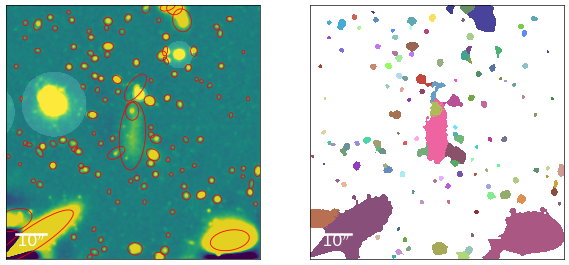

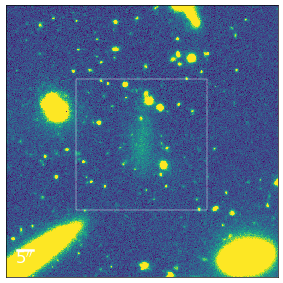

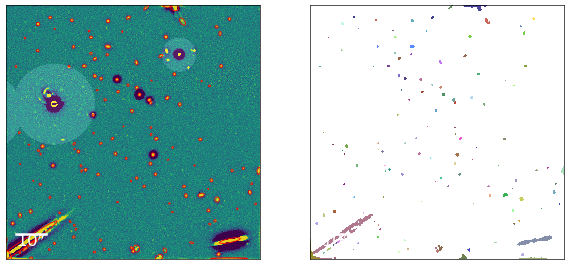

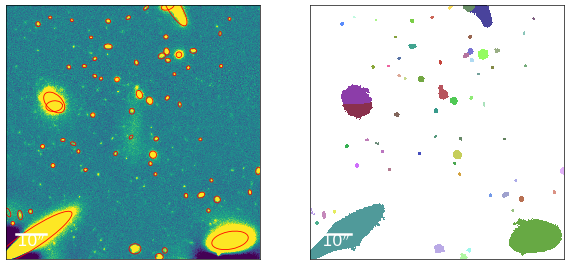

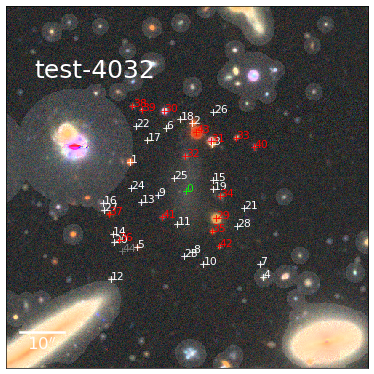

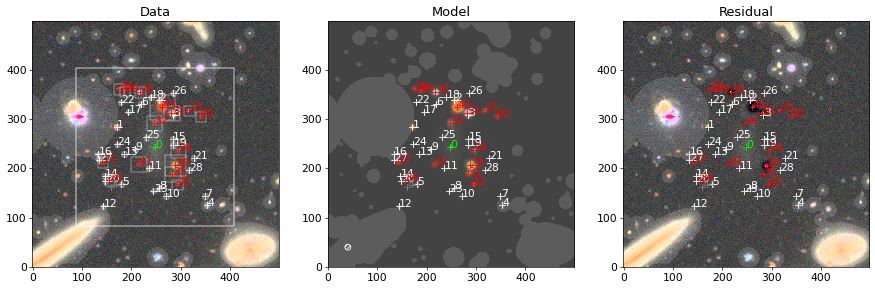

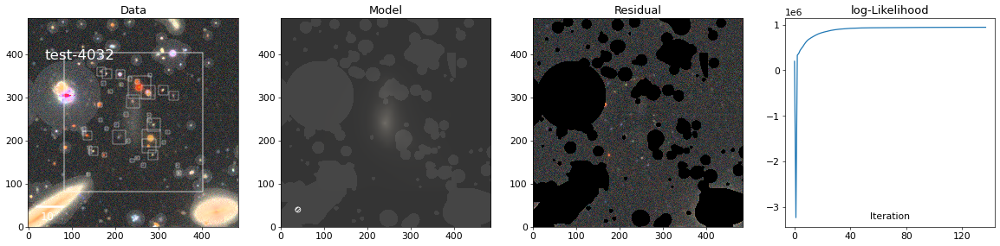

In [271]:
fitter.fit()

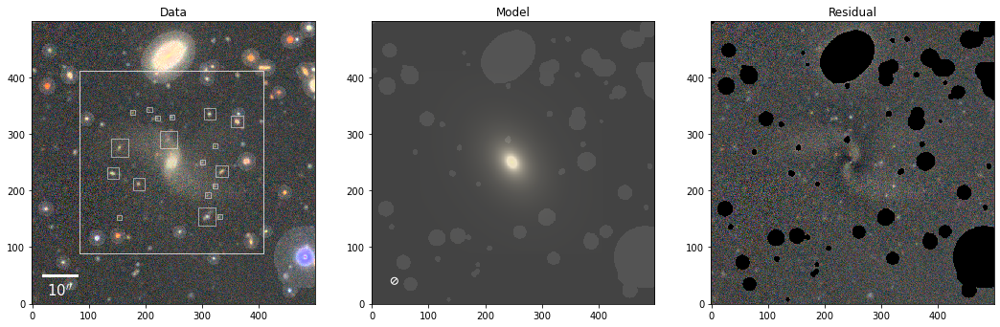

In [256]:
fig = kz.display.display_scarlet_results_tigress(
        fitter._blend,
        fitter.final_mask,
        show_ind=fitter.sed_ind,
#         zoomin_size=50,
        minimum=-0.2,
        stretch=0.7,
        Q=1,
        channels=fitter.data.channels,
        show_loss=False,
        show_mask=False,
        show_gray_mask=True,
        show_mark=False,
        scale_bar=True)

In [193]:
img = data.images[2]
coeffs = scarlet.wavelet.Starlet.from_image(img).coefficients

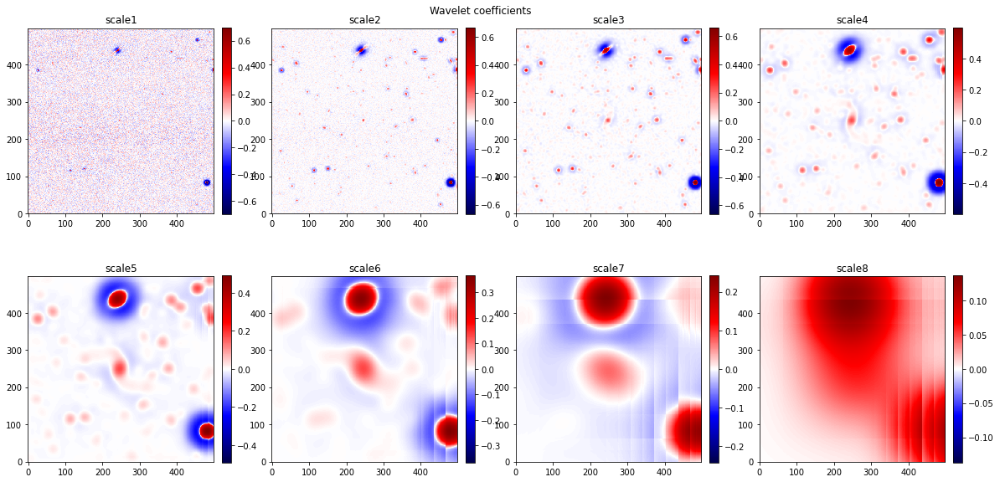

In [195]:
# Display the detection coefficients
lvl = len(coeffs)
plt.figure(figsize =(lvl*5//2, 2*5))
plt.suptitle('Wavelet coefficients', y=0.9)
for i in range(lvl):
    plt.subplot(2, lvl//2, i+1)
    plt.title('scale'+str(i+1))
    img = coeffs[i]
    img = np.arcsinh(10*img)/10
    vmax = np.max(np.abs(img))
    im = plt.imshow(img, cmap="seismic", vmin=-vmax, vmax=vmax)
    plt.colorbar(im, fraction=0.046, pad=0.04)
plt.show()

In [181]:
M = scarlet.wavelet.get_multiresolution_support(img, coeffs, 0.1, K=3, epsilon=1e-1, max_iter=20)

detect = M * coeffs

detect[detect<0] = 0

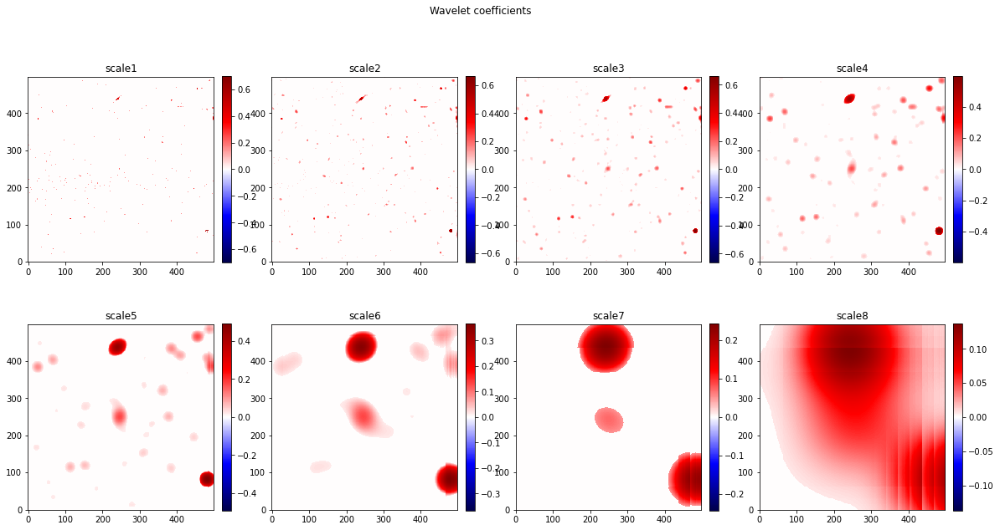

In [182]:
# Display the detection coefficients
lvl = len(coeffs)
plt.figure(figsize =(lvl*5//2, 2*5))
plt.suptitle('Wavelet coefficients')
for i in range(lvl):
    plt.subplot(2, lvl//2, i+1)
    plt.title('scale'+str(i+1))
    img = detect[i]
    img = np.arcsinh(10*img)/10
    vmax = np.max(np.abs(img))
    im = plt.imshow(img, cmap="seismic", vmin=-vmax, vmax=vmax)
    plt.colorbar(im, fraction=0.046, pad=0.04)
plt.show()

In [187]:
reconstruction = scarlet.wavelet.starlet_reconstruction(detect)
residual = img - reconstruction

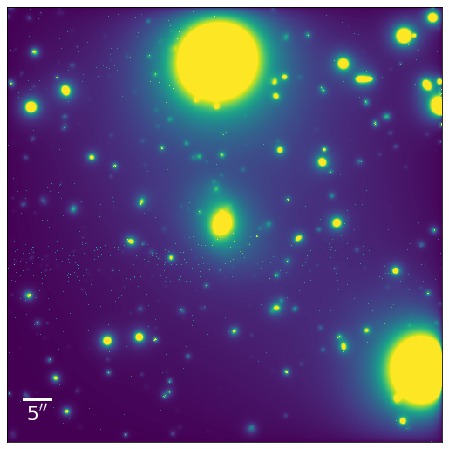

In [189]:
display_single(reconstruction);

#### Step-by-step

In [220]:
fitter._first_gaia_search()

    Query GAIA stars...
    Taking Gaia catalogs stored in `Tigress`
    2 stars from Gaia are masked!


In [221]:
# Set the weights of saturated star centers to zero
# In order to make the box size estimation more accurate.
temp = np.copy(fitter.data.masks)
for i in range(len(fitter.data.channels)):
    temp[i][~fitter.msk_star_ori.astype(bool)] = 0
    fitter.data.weights[i][temp[i].astype(bool)] = 0.0

    Detected 101 objects


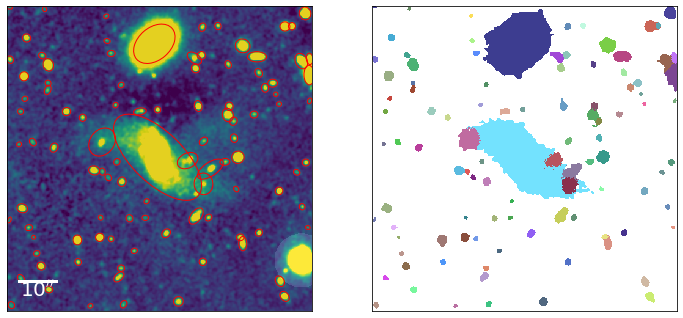

In [222]:
# Replace the vanilla detection with a convolved vanilla detection
first_dblend_cont = 0.07 if max(
    fitter.data.images.shape) * fitter.pixel_scale > 200 else 0.002

if fitter.method == 'wavelet':
    first_dblend_cont = 0.07 if max(
    fitter.data.images.shape) * fitter.pixel_scale > 200 else 0.002
        
fitter._first_detection(first_dblend_cont, conv_radius=2, lvl=4)

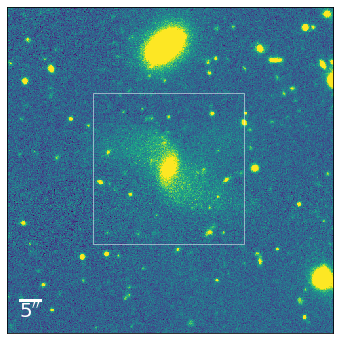

In [223]:
fitter._estimate_box(fitter.cen_obj)

In [224]:
fitter._mask_stars_outside_box()

    2 stars from Gaia are masked!


    Detected 79 objects


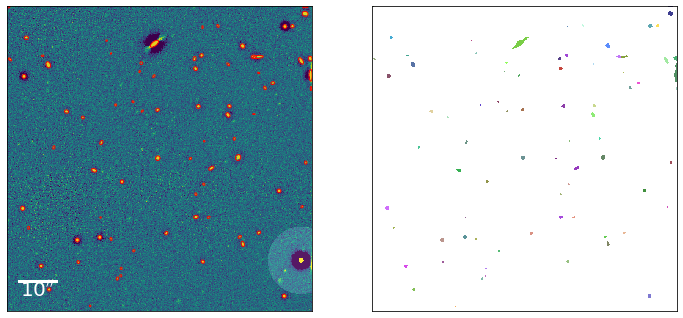

In [225]:
fitter._cpct_obj_detection()

In [226]:
from kuaizi.display import draw_circles

    Detected 41 objects


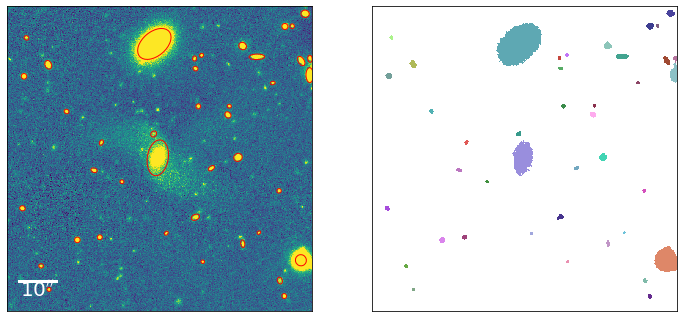

In [227]:
fitter._big_obj_detection()

In [228]:
fitter._merge_catalogs()

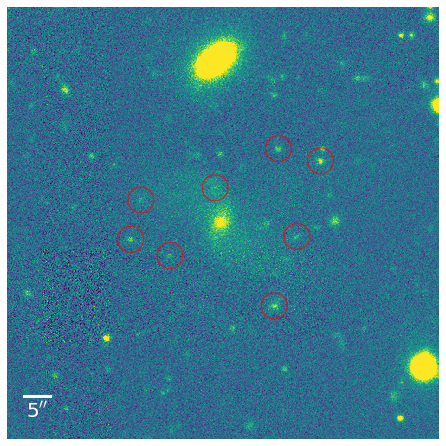

In [229]:
draw_circles(fitter.data.images[0], fitter.obj_cat_big)

In [230]:
fitter._construct_obs_frames()

In [231]:
src = fitter.cen_obj

In [232]:
fitter._add_central_source(min_grad=fitter.min_grad, 
                           monotonic=fitter.monotonic, 
                           variance=fitter.variance,
                           thresh=0.1)
fitter._add_other_sources(min_grad=0.1, thresh=0.1)

  - Wavelet modeling with the following hyperparameters:
    min_grad = -0.20, starlet_thresh = 0.30 (contam_ratio = 0.10), 
     monotonic = True, variance = 0.00040, scales = [0, 1, 2, 3, 4, 5, 6].
    Added constant sky background
    Total number of sources: 20


[<AxesSubplot:title={'center':'Data'}>,
 <AxesSubplot:title={'center':'Model'}>,
 <AxesSubplot:title={'center':'Residual'}>]

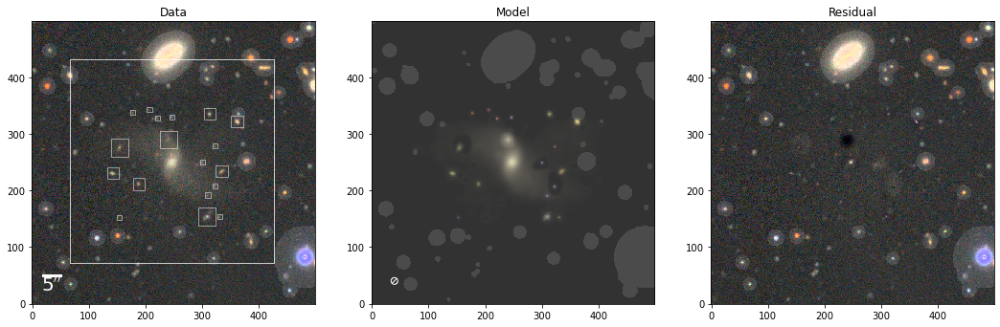

In [233]:
kz.display.display_scarlet_model(
    fitter.blend,
#     show_ind=[0],
    #zoomin_size=50,
    minimum=-0.2,
    stretch=0.9,
    add_boxes=True,
    channels='griz',
    show_mask=False,
    show_mark=False, 
    show_loss=False)

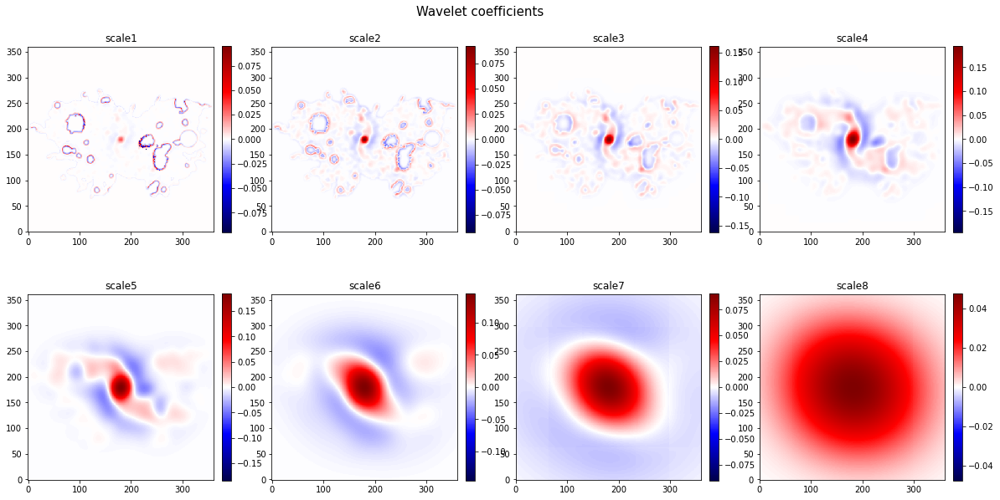

In [234]:
src = fitter.blend.sources[0]
coeffs = src.morphology.transform.coefficients

# Display the detection coefficients
lvl = len(coeffs)
plt.figure(figsize =(lvl*5//2, 2*5))
plt.suptitle('Wavelet coefficients', y=0.93, fontsize=15)
for i in range(lvl):
    plt.subplot(2, lvl//2, i+1)
    plt.title('scale'+str(i+1))
    img = coeffs[i]
    img = np.arcsinh(10*img)/10
    vmax = np.max(np.abs(img))
    im = plt.imshow(img, cmap="seismic", vmin=-vmax, vmax=vmax)
    plt.colorbar(im, fraction=0.046, pad=0.04)
plt.show()

  - Optimizing scarlet model...
    Optimizaiton: Succeed for e_rel = 0.0001 with 86 iterations! Try higher accuracy!
    Optimizaiton: Succeed for e_rel = 0.0005 with 107 iterations! Try higher accuracy!
    Optimizaiton: Succeed for e_rel = 0.0002 with 151 iterations! Try higher accuracy!
  - After 141 iterations, logL = 1156408.45
    Elapsed time for fitting: 118.24 s


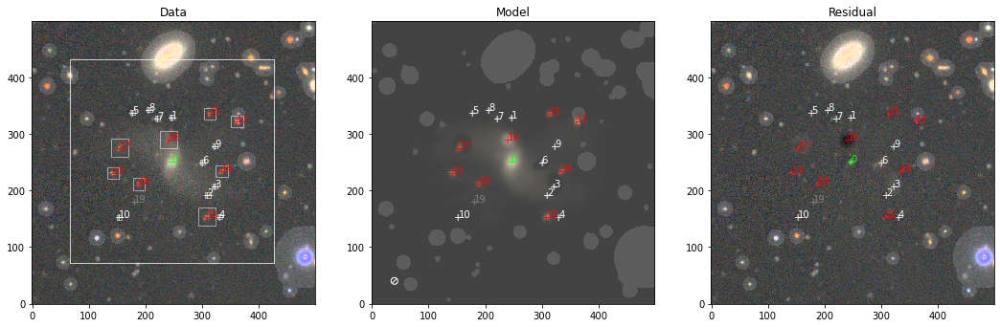

In [235]:
fitter._optimize()

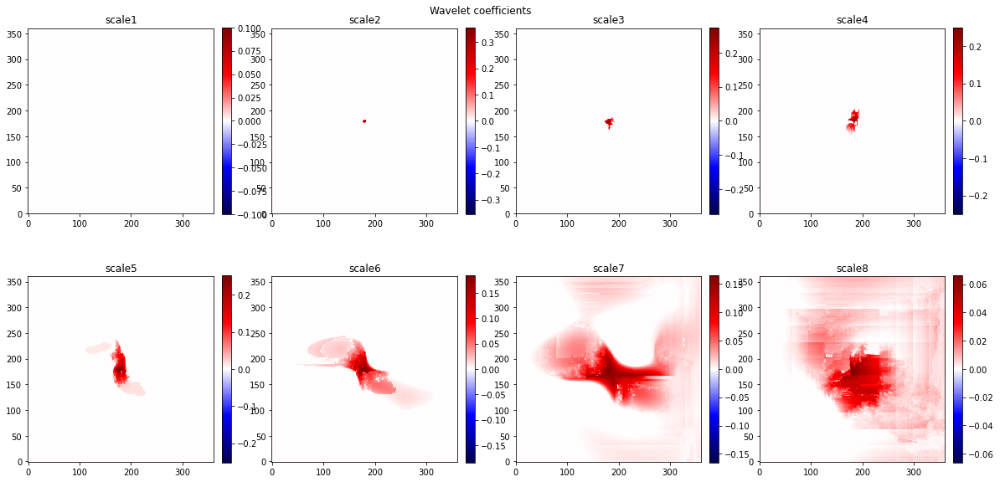

In [236]:
src = fitter.blend.sources[0]
coeffs = src.morphology.transform.coefficients

# Display the detection coefficients
lvl = len(coeffs)
plt.figure(figsize =(lvl*5//2, 2*5))
plt.suptitle('Wavelet coefficients', y=0.9)
for i in range(lvl):
    plt.subplot(2, lvl//2, i+1)
    plt.title('scale'+str(i+1))
    img = coeffs[i]
    img = np.arcsinh(10*img)/10
    vmax = np.max(np.abs(img))
    im = plt.imshow(img, cmap="seismic", vmin=-vmax, vmax=vmax)
    plt.colorbar(im, fraction=0.046, pad=0.04)
plt.show()

  - Components [0] are considered as the target galaxy.
  - Masking stars and other sources that are modeled, to deal with leaky flux issue.
  - Saving the results as /scratch/gpfs/jiaxuanl/Data/HSC/LSBG/Model/nsa_z002_004/test-18486-trained-model-wavelet.df


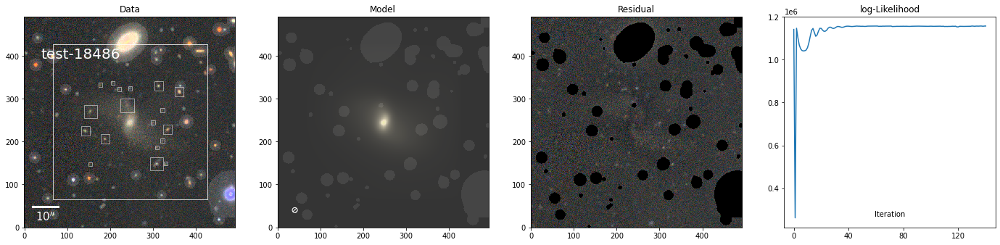

In [237]:
try:
    fitter._find_sed_ind()
    fitter._gen_final_mask()
    fitter._display_results()
except:
    pass

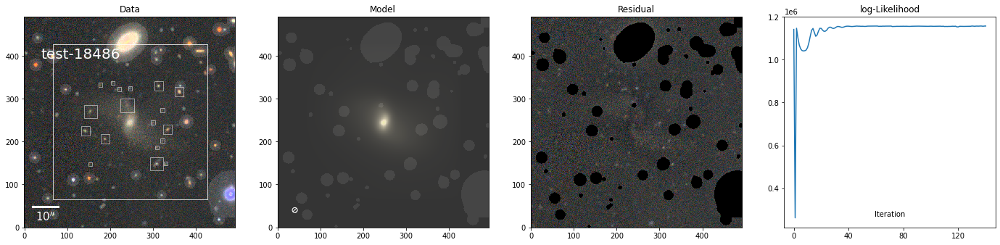

In [238]:
fitter._display_results()

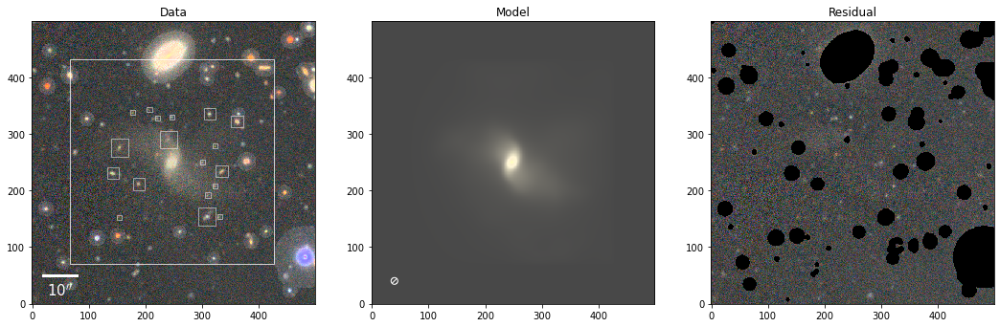

In [243]:
fig = kz.display.display_scarlet_results_tigress(
        fitter._blend,
        fitter.final_mask,
        show_ind=fitter.sed_ind,
#         zoomin_size=50,
        minimum=-0.2,
        stretch=0.7,
        Q=1,
        channels=fitter.data.channels,
        show_loss=False,
        show_mask=False,
        show_gray_mask=False,
        show_mark=False,
        scale_bar=True)

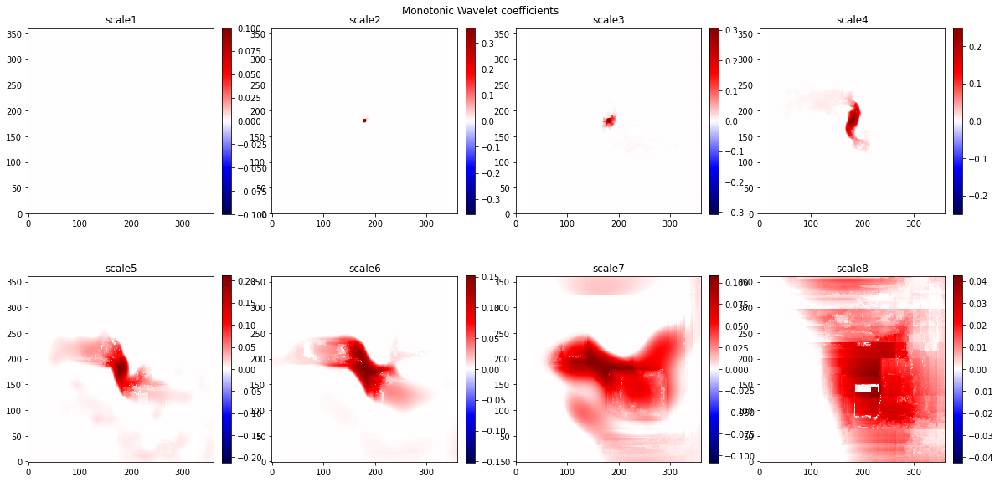

In [245]:
src = fitter.blend.sources[0]
coeffs = src.morphology.transform.coefficients

# Display the detection coefficients
lvl = len(coeffs)
plt.figure(figsize =(lvl*5//2, 2*5))
plt.suptitle('Monotonic Wavelet coefficients', y=0.9)
for i in range(lvl):
    plt.subplot(2, lvl//2, i+1)
    plt.title('scale'+str(i+1))
    img = coeffs[i]
    img = np.arcsinh(10*img)/10
    vmax = np.max(np.abs(img))
    im = plt.imshow(img, cmap="seismic", vmin=-vmax, vmax=vmax)
    plt.colorbar(im, fraction=0.046, pad=0.04)
plt.show()

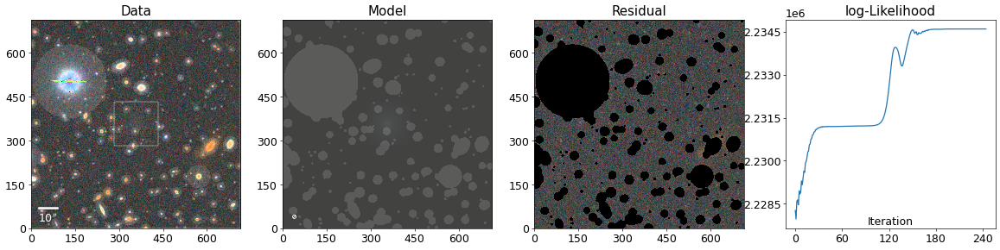

In [239]:
fig = kz.display.display_scarlet_results_tigress(
        fitter._blend,
        fitter.final_mask,
#         show_ind=fitter.sed_ind,
#         zoomin_size=50,
        minimum=-0.2,
        stretch=0.7,
        Q=1,
        channels=fitter.data.channels,
        show_loss=True,
        show_mask=False,
        show_mark=False,
        scale_bar=True)

In [240]:
from kuaizi.measure import cal_cnu
david = fitter.blend.sources[0]
print(david.get_parameter(3) * 0.168)
sed, morph = david.get_models_of_children()
true_flux = (2 * np.pi * david.parameters[3]**2) / cal_cnu(david.parameters[2])**2
print('mag:', -2.5 * np.log10(true_flux * sed) + 27.0)
print('Sky:', -2.5 * np.log10(fitter.blend.sources[-1].get_model().mean(axis=(1, 2)) / 0.168**2) + 27)

[[9.78091718]]
mag: [[20.95255956 20.47541381 20.3080208  20.54341934]]
Sky: [30.39239143 29.73059861 28.67050248 28.82035989]


[<AxesSubplot:title={'center':'Background'}>,
 <AxesSubplot:title={'center':'Mock Image'}>,
 <AxesSubplot:title={'center':'Model'}>]

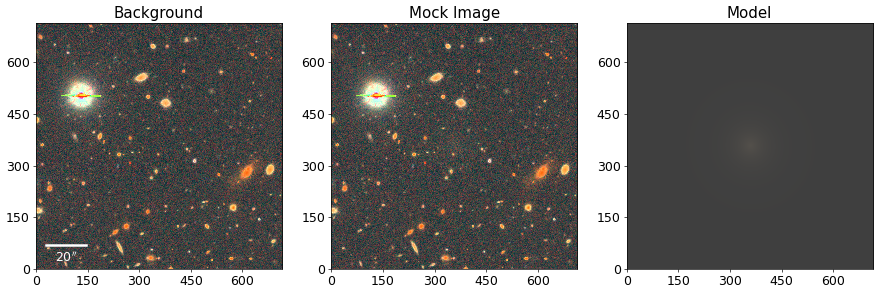

In [241]:
import pickle

with open(f'./Cutout/mock_sample/mock_{lsbg["viz-id"]}.pkl', 'rb') as fp:
    gal = pickle.load(fp)
gal.display(stretch=0.8)

In [244]:
gal.model.info

{'comp': [{'model': galsim.sersic.Sersic,
   'model_params': {'n': 0.9633822325633931,
    'half_light_radius': 12.097237240417355},
   'shear_params': {'q': 0.956260928877007,
    'beta': coord.Angle(-1.2817051303891247, coord.radians)},
   'sed': array([0.5723978 , 0.83970861, 1.        , 1.16199369])}],
 'imag': 19.8831568836033,
 'flux_fraction': [1.0],
 'ra': 346.1801183805011,
 'dec': 0.9159681129547782,
 'gmag': 20.4889119964195,
 'rmag': 20.072835367354816,
 'zmag': 19.720147458149533}

In [100]:
from kuaizi.measure import makeMeasurement, makeMeasurementMockGal

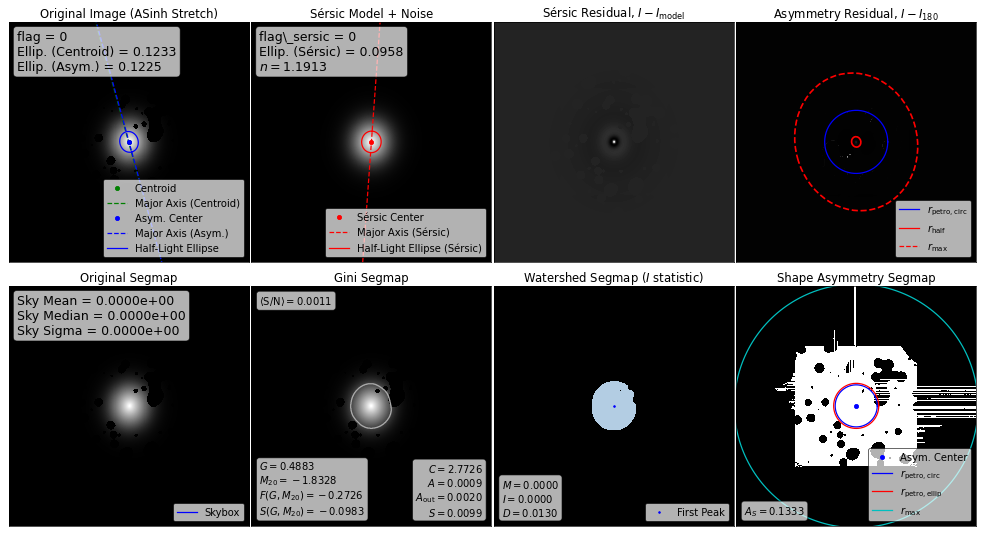

In [101]:
measurement, t = makeMeasurement(list(np.array(fitter.blend.sources)[fitter.sed_ind]),
                                 fitter.blend.observations[0],
                                 aggr_mask=fitter.final_mask.astype(bool),
                                 makesegmap=False, sigma=0.02,
                                 zeropoint=27.0, out_prefix=None,
                                 show_fig=True, asinh_a=0.02, framealpha=0.7)
#row = _write_to_row(row, measurement)

In [102]:
# Sky SB
-2.5 * np.log10(fitter.blend.sources[-1].get_model().mean(axis=(1, 2)) / 0.168**2) + 27

Parameter([29.4934964 , 28.74595229, 28.74534842, 28.11704383])

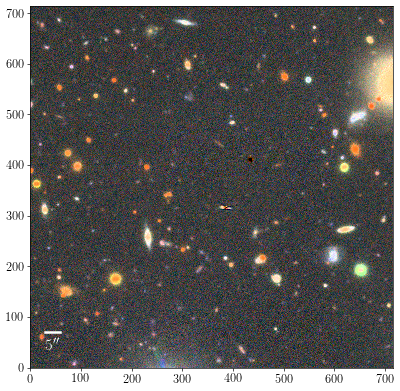

In [142]:
display_rgb(gal.mock.images - fitter.observation.render(fitter.blend.get_model()), stretch=0.8);

In [104]:
print(measurement['rhalf_circularized'] * 0.168)
print(gal.model.info['comp'][0]['model_params']['half_light_radius'])
measurement['sersic_rhalf'] * 0.168 * np.sqrt(1 - measurement['ellipticity_asymmetry'])

4.914961939897793
4.556496604388463


5.068036433903733

In [105]:
measurement['SB_eff_avg'], measurement['mag']

(array([25.790022, 25.45826 , 25.405367, 25.216639], dtype=float32),
 array([20.323706, 19.991943, 19.93905 , 19.75032 ], dtype=float32))

In [106]:
-2.5 * np.log10(measurement['flux_circ']) + 27

array([20.344858, 20.013096, 19.960203, 19.771473], dtype=float32)

In [107]:
gal.model.info['gmag'], gal.model.info['rmag'], gal.model.info['imag']

(20.420431085096865, 20.089120531929915, 19.987150741690147)

In [108]:
measurement['ellipticity_asymmetry'], 1 - gal.model.info['comp'][0]['shear_params']['q']

(0.12251074353348768, 0.1277100516230144)

In [12]:
import dill
from kuaizi.measure import makeMeasurement, makeMeasurementMockGal

[<AxesSubplot:title={'center':'Data'}>,
 <AxesSubplot:title={'center':'Model'}>,
 <AxesSubplot:title={'center':'Residual'}>,
 <AxesSubplot:title={'center':'log-Likelihood'}, xlabel='Iteration'>]

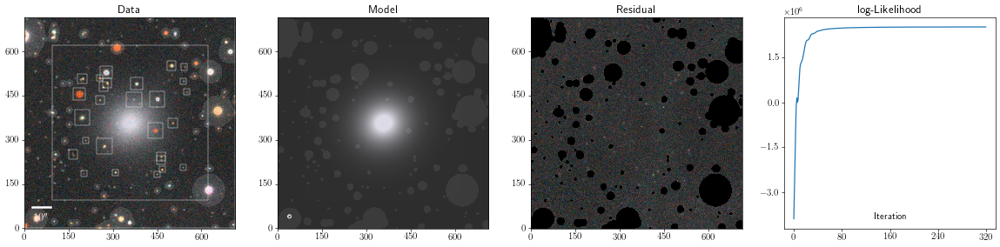

In [20]:
ind = 888
method = 'spergel'
# method = 'vanilla'
with open(f'./Model/mock_sample/spergel/mock-{ind}-trained-model-{method}.df', "rb") as fp:
    blend, info, mask = dill.load(fp)
    fp.close()
    
kz.display.display_scarlet_results_tigress(
    blend,
    mask,
    show_ind=[0],
    #zoomin_size=50,
    minimum=-0.2,
    stretch=1,
    add_boxes=True,
    channels='griz',
    show_mask=False,
    show_mark=False, 
    show_loss=True)

In [21]:
print(blend.sources[0].bbox)

<Box shape=(4, 525, 525), origin=(0, 96, 96)>


In [251]:
from kuaizi.measure import cal_cnu
david = blend.sources[0]
print(david.get_parameter(3) * 0.168)
sed, morph = david.get_models_of_children()
true_flux = (2 * np.pi * david.parameters[3]**2) / cal_cnu(david.parameters[2])**2
-2.5 * np.log10(true_flux * sed) + 27.0

[[5.35024453]]


Parameter([[21.09256138, 20.52215181, 20.21650564, 20.24670457]])

[<AxesSubplot:title={'center':'Background'}>,
 <AxesSubplot:title={'center':'Mock Image'}>,
 <AxesSubplot:title={'center':'Model'}>]

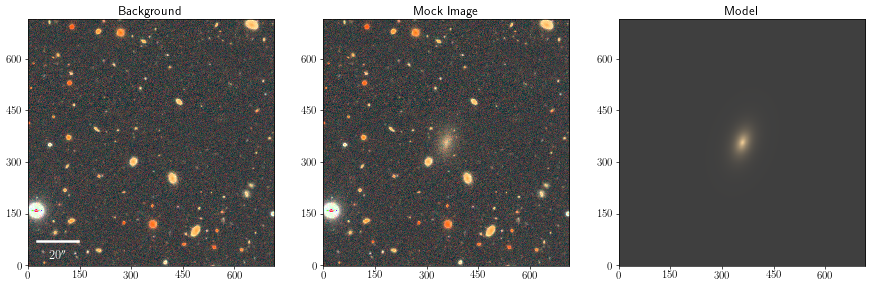

In [16]:
import pickle

with open(f'./Cutout/mock_sample/mock_{ind}.pkl', 'rb') as fp:
    gal = pickle.load(fp)
gal.display(stretch=0.8)

In [17]:
gal.model.info

{'comp': [{'model': galsim.sersic.Sersic,
   'model_params': {'n': 1.028798351313437,
    'half_light_radius': 5.402173888566778},
   'shear_params': {'q': 0.6110458275533068,
    'beta': coord.Angle(1.2569557471007504, coord.radians)},
   'sed': array([0.48227494, 0.78764329, 1.        , 1.14666919])}],
 'imag': 19.235374805524145,
 'flux_fraction': [1.0],
 'ra': 150.23999749502534,
 'dec': 1.6820617760172785,
 'gmag': 20.02713806681768,
 'rmag': 19.494550856382407,
 'zmag': 19.086779447544068}

In [17]:
src = blend.sources[0]

In [18]:
sed, morph = src.get_models_of_children()

In [23]:
from kuaizi.measure import cal_cnu

In [24]:
true_flux = (2 * np.pi * src.parameters[3]
             ** 2) / cal_cnu(src.parameters[2])**2

In [25]:
true_flux

Parameter([[2281.71784862]])

In [ ]:

measure_dict['flux'] = np.array(true_flux * sed).ravel()

In [15]:
measurement['mag'] + 2.5 * np.log10(2 * np.pi * 5.29124731838925**2)

array([25.68790056, 25.17335591, 24.890307  , 24.7395501 ])

In [13]:
measurement

{'flux': array([ 589.02776564,  946.13613239, 1227.9288129 , 1410.83411416]),
 'mag': array([20.07466058, 19.56011593, 19.27706702, 19.12631012]),
 'xc_centroid': 357.1417046352392,
 'yc_centroid': 357.2510046552573,
 'xc_peak': 357,
 'yc_peak': 357,
 'ellipticity_centroid': 0.3166487822744145,
 'elongation_centroid': 1.4633763342492085,
 'orientation_centroid': 1.2173937606813743,
 'xc_asymmetry': 357.09274031872377,
 'yc_asymmetry': 357.1181498081936,
 'ellipticity_asymmetry': 0.3166544769087113,
 'elongation_asymmetry': 1.4633885292410251,
 'orientation_asymmetry': 1.217393769881961,
 'rpetro_circ': 69.94761766006506,
 'rpetro_ellip': 82.34551445847171,
 'rhalf_circ': 31.04244076068336,
 'rhalf_ellip': 36.70931702963555,
 'rhalf_circularized': 30.34565257827869,
 'rhalf_spergel': 31.495519752316966,
 'r20': 15.32360043870817,
 'r50': 30.949788953565008,
 'r80': 54.08800357963841,
 'SB_0_circ': array([24.73551487, 24.22097022, 23.93792131, 23.78716441]),
 'SB_0_ellip': array([24.7355

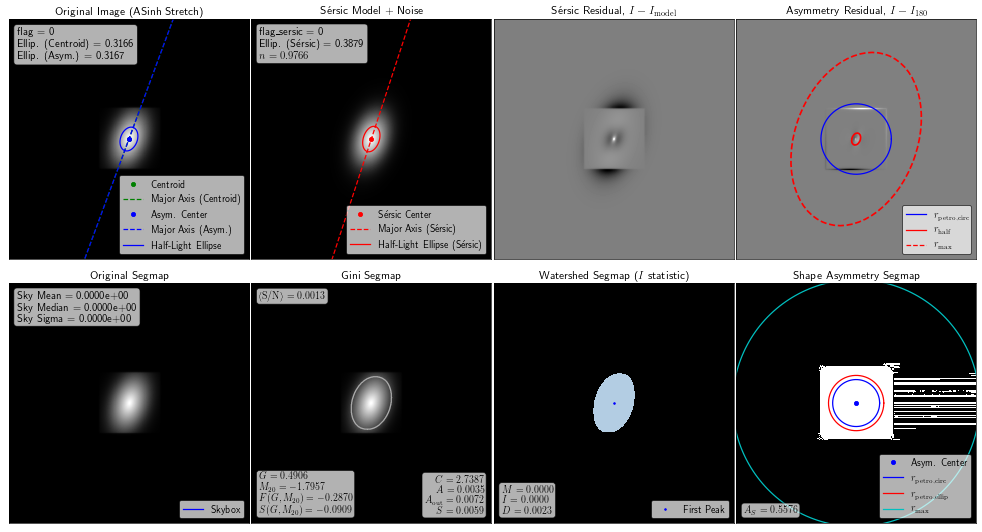

In [12]:
measurement, t = makeMeasurement(list(np.array(blend.sources)[info['sed_ind']]),
                                 blend.observations[0],
                                 aggr_mask=mask.astype(bool),
                                 method='spergel',
                                 makesegmap=False, sigma=0.02,
                                 zeropoint=27.0, out_prefix=None,
                                 show_fig=True, asinh_a=0.02, framealpha=0.7)

In [ ]:
from scarlet.wavelet import 

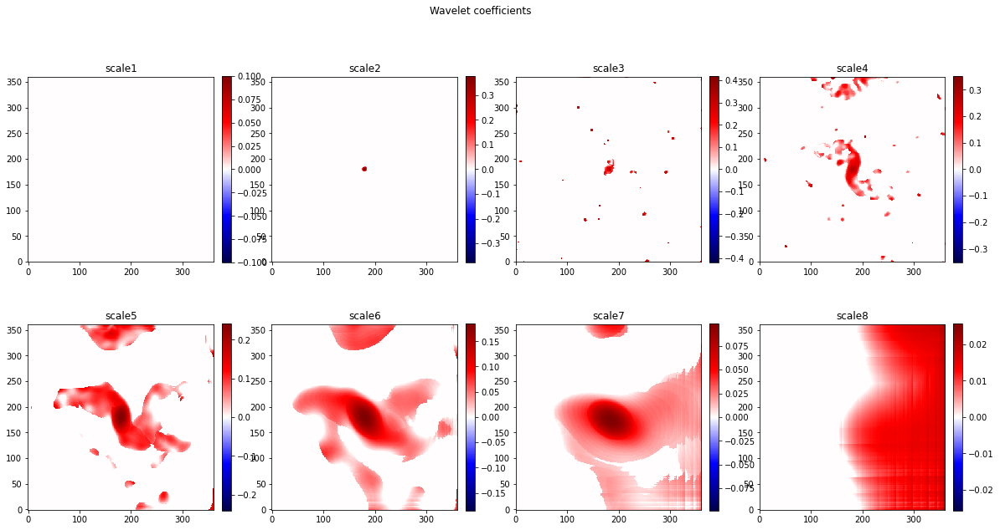

In [65]:
src = fitter.blend.sources[0]
coeffs = src.morphology.transform.coefficients

# Display the detection coefficients
lvl = len(coeffs)
plt.figure(figsize =(lvl*5//2, 2*5))
plt.suptitle('Wavelet coefficients')
for i in range(lvl):
    plt.subplot(2, lvl//2, i+1)
    plt.title('scale'+str(i+1))
    img = coeffs[i]
    img = np.arcsinh(10*img)/10
    vmax = np.max(np.abs(img))
    im = plt.imshow(img, cmap="seismic", vmin=-vmax, vmax=vmax)
    plt.colorbar(im, fraction=0.046, pad=0.04)
plt.show()